#Custom Training Object Detection model YOLOv5x on VPLab Dataset
---
DONT RUN!! ALL OUTPUT WILL BE LOST!

###Import Dependencies

In [183]:
from pathlib import Path
import torch
import torchvision
import cv2
import matplotlib.pyplot as plt
import numpy as np

### Mount Drive containing dataset

In [170]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Custom Training on VPLab dataset

### GPU information

In [ ]:
!nvidia-smi

Tue Nov 16 08:17:11 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   69C    P8    32W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
#To make training run faster 
!git clone https://github.com/NVIDIA/apex && cd apex && pip install -v --no-cache-dir --global-option="--cpp_ext" --global-option="--cuda_ext" . --user && cd .. && rm -rf apex

Cloning into 'apex'...
remote: Enumerating objects: 8587, done.
remote: Counting objects: 100% (674/674), done.
remote: Compressing objects: 100% (417/417), done.
remote: Total 8587 (delta 398), reused 442 (delta 245), pack-reused 7913
Receiving objects: 100% (8587/8587), 14.44 MiB | 18.72 MiB/s, done.
Resolving deltas: 100% (5797/5797), done.
/usr/local/lib/python3.7/dist-packages/pip/_internal/commands/install.py:232: UserWarning: Disabling all use of wheels due to the use of --build-option / --global-option / --install-option.
  cmdoptions.check_install_build_global(options)
Using pip 21.1.3 from /usr/local/lib/python3.7/dist-packages/pip (python 3.7)
User install by explicit request
Created temporary directory: /tmp/pip-ephem-wheel-cache-8f1vk82g
Created temporary directory: /tmp/pip-req-tracker-88ka4mr7
Initialized build tracking at /tmp/pip-req-tracker-88ka4mr7
Created build tracker: /tmp/pip-req-tracker-88ka4mr7
Entered build tracker: /tmp/pip-req-tracker-88ka4mr7
Created tempor

### Cloning Official Opensource YOLOv5 code from GitHub

In [3]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 10041, done.
remote: Total 10041 (delta 0), reused 0 (delta 0), pack-reused 10041
Receiving objects: 100% (10041/10041), 10.38 MiB | 18.24 MiB/s, done.
Resolving deltas: 100% (6964/6964), done.
/content/yolov5


### Using Weights and Biases for Training Visualization

In [ ]:
!pip install wandb

     |████████████████████████████████| 1.7 MB 5.3 MB/s 
     |████████████████████████████████| 139 kB 38.1 MB/s 
     |████████████████████████████████| 97 kB 6.7 MB/s 
     |████████████████████████████████| 180 kB 44.0 MB/s 
     |████████████████████████████████| 63 kB 1.6 MB/s 
  Created wheel for subprocess32: filename=subprocess32-3.5.4-py3-none-any.whl size=6502 sha256=719ff48f180815cc5e3dc094d7c7686f5ff5d655f9ca0b133b2e0511f3f7e5e7
  Stored in directory: /root/.cache/pip/wheels/50/ca/fa/8fca8d246e64f19488d07567547ddec8eb084e8c0d7a59226a
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8807 sha256=0305ee57c2a8080e8b472d5f5053e081fc97c37ab58a3157e24dd7d75efc63f3
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built subprocess32 pathtools


### Training the model for 7 epochs

In [ ]:
!python train.py --batch 4 --epochs 30 \
  --data /content/drive/MyDrive/CS6350TPA_3/YOLOv5-PLA-Dataset/dataset.yaml --cfg ./models/yolov5x.yaml --weights yolov5x.pt \
  --name yolov5x_vplab --cache

wandb: Currently logged in as: rohitth_ed18b027 (use `wandb login --relogin` to force relogin)
train: weights=yolov5x.pt, cfg=./models/yolov5x.yaml, data=/content/drive/MyDrive/CS6350TPA_3/YOLOv5-PLA-Dataset/dataset.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=30, batch_size=4, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=yolov5x_vplab, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-92-ge80a09b torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias

### Weights and Biases Results

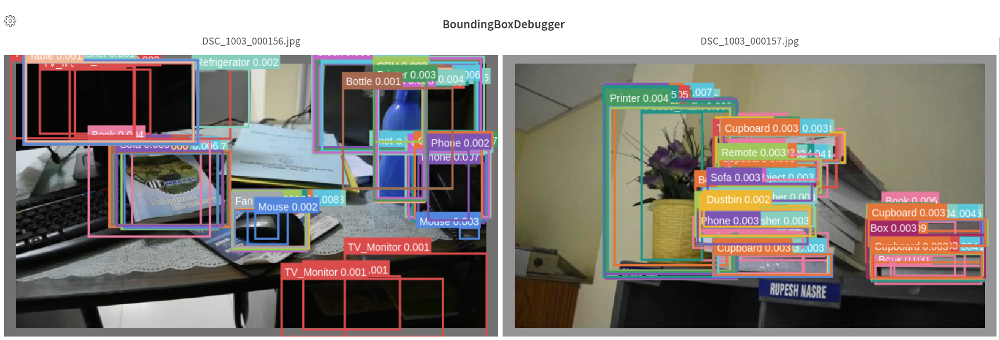

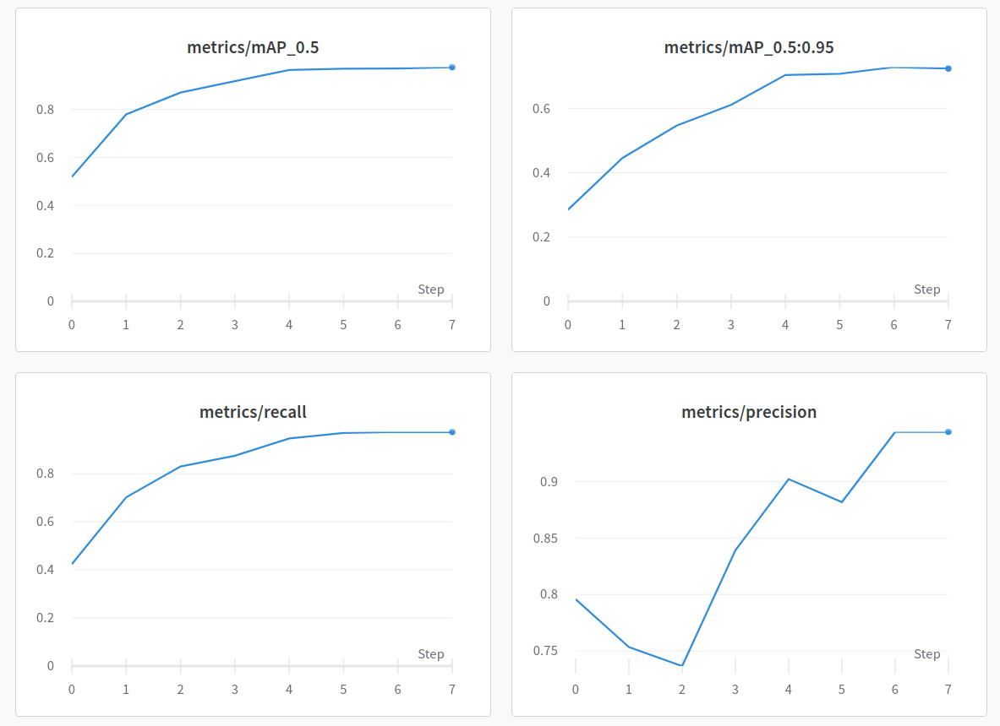

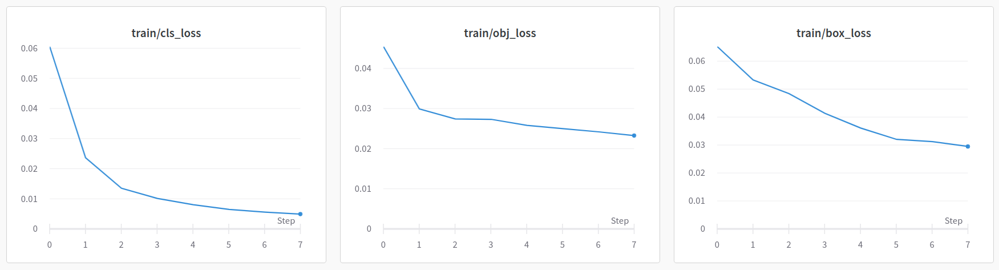

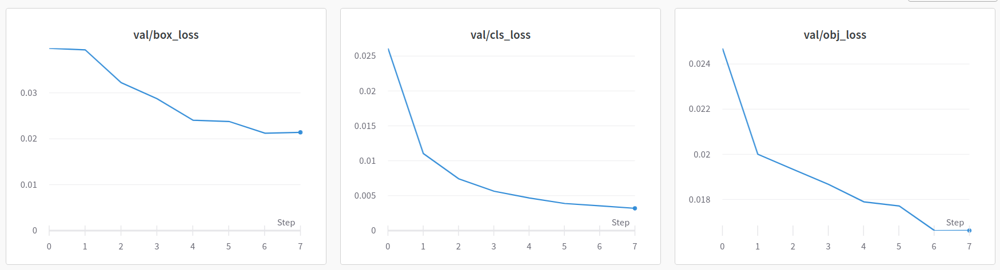

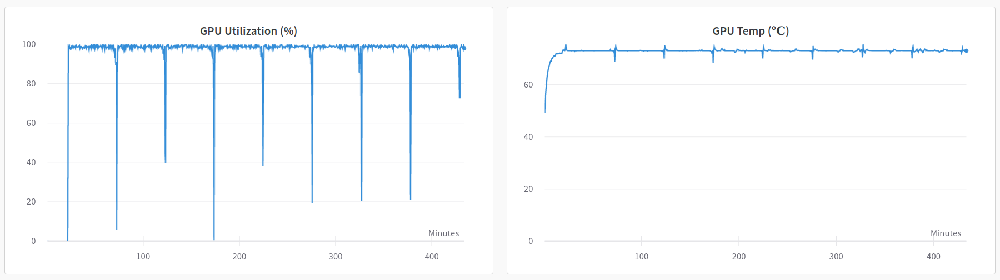

#Testing

### Helper Functions

In [179]:
classes=[]
config_path = "/content/drive/MyDrive/CS6350TPA_3/YOLOv5-PLA-Dataset/dataset.yaml"
with open(config_path, mode='r') as file:
  for line in file.readlines():
    if line.startswith('-'):
      classes.append(line[2:-1])

def draw_ground_truth(img, labels):
  for label in labels:
    annotations = label.split()
    class_id = int(annotations[0])

    h, w, _ = img.shape
    rx = float(annotations[1])
    ry = float(annotations[2])
    rw = float(annotations[3])
    rh = float(annotations[4])

    cx, cy = rx * w, ry * h
    x1, y1 = cx - (rw * w)/2 , cy - (rh * h)/2
    x2, y2 = cx + (rw * w)/2 , cy + (rh * h)/2

    cv2.rectangle(
      img,
      (int(x1), int(y1)),
      (int(x2), int(y2)),
      color=(0, 165, 0),
      thickness=2
    )

    ((label_width, label_height), _) = cv2.getTextSize(
        classes[class_id], 
        fontFace=cv2.FONT_HERSHEY_PLAIN,
        fontScale=1.75, 
        thickness=2
    )

    cv2.rectangle(
      img,
      (int(x1), int(y1)),
      (int(x1 + label_width + label_width * 0.05), int(y1 + label_height + label_height * 0.25)),
      color=(0, 165, 0),
      thickness=cv2.FILLED
    )

    cv2.putText(
      img,
      classes[class_id],
      org=(int(x1), int(y1 + label_height + label_height * 0.25)), # bottom left
      fontFace=cv2.FONT_HERSHEY_PLAIN,
      fontScale=1.75,
      color=(255, 255, 255),
      thickness=2
    )

  return img

def load_image(img_path: Path, resize=True, show_gt=False):
  img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
  if resize:
    img = cv2.resize(img, (720, 405), interpolation = cv2.INTER_AREA)
  
  if show_gt:
    label_path = "/content/drive/MyDrive/CS6350TPA_3/YOLOv5-PLA-Dataset/labels/test/" + str(img_path)[12:-3]+ "txt"
    with open(label_path, mode='r') as file:
      lines = file.readlines()
      img = draw_ground_truth(img, lines)

  return img

def show_grid(image_paths, show_gt=False, resize=True):
  images = [load_image(img, show_gt=show_gt, resize=resize) for img in image_paths]
  images = torch.as_tensor(images)
  images = images.permute(0, 3, 1, 2)
  grid_img = torchvision.utils.make_grid(images, nrow=5)
  plt.figure(figsize=(24, 48))
  plt.imshow(grid_img.permute(1, 2, 0))
  plt.axis('off');

### 50 Random images from test dataset

In [15]:
!rm -rf ./data/images/ | mkdir ./data/images/ | find /content/drive/MyDrive/CS6350TPA_3/YOLOv5-PLA-Dataset/images/test -maxdepth 1 -type f | shuf -n 50 | xargs cp -t "./data/images/"

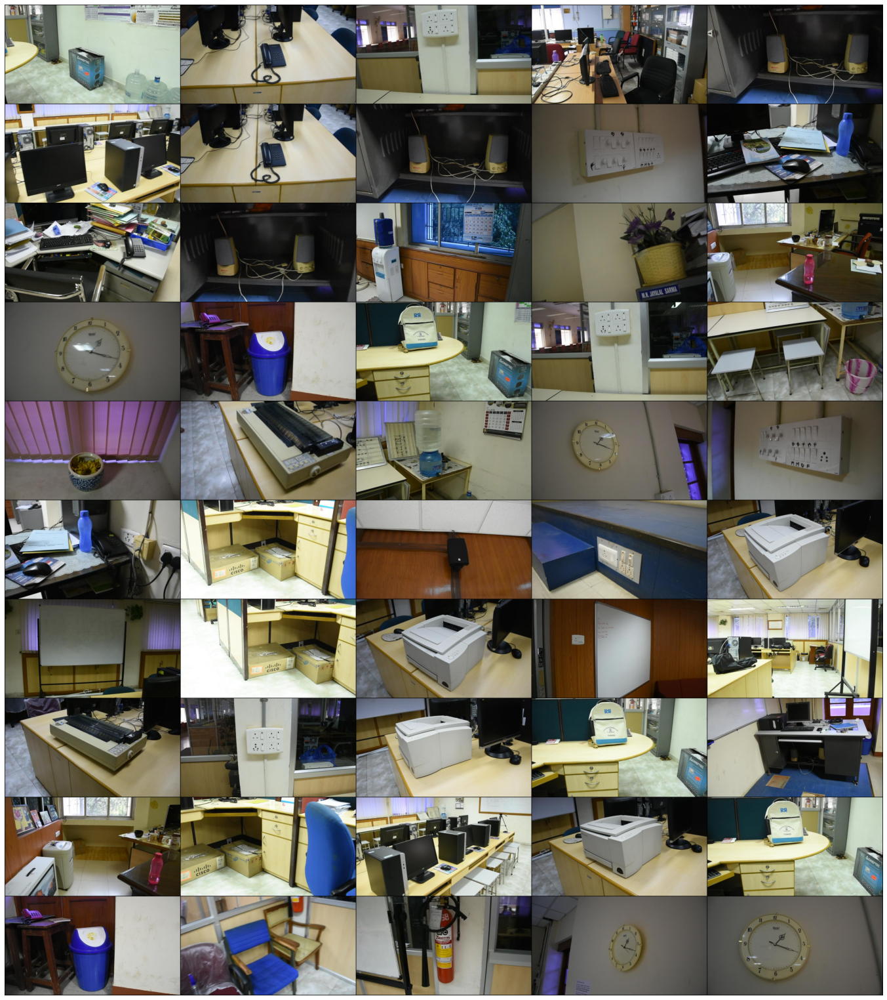

In [180]:
img_paths = list(Path("./data/images").glob("*.jpg"))
show_grid(img_paths)

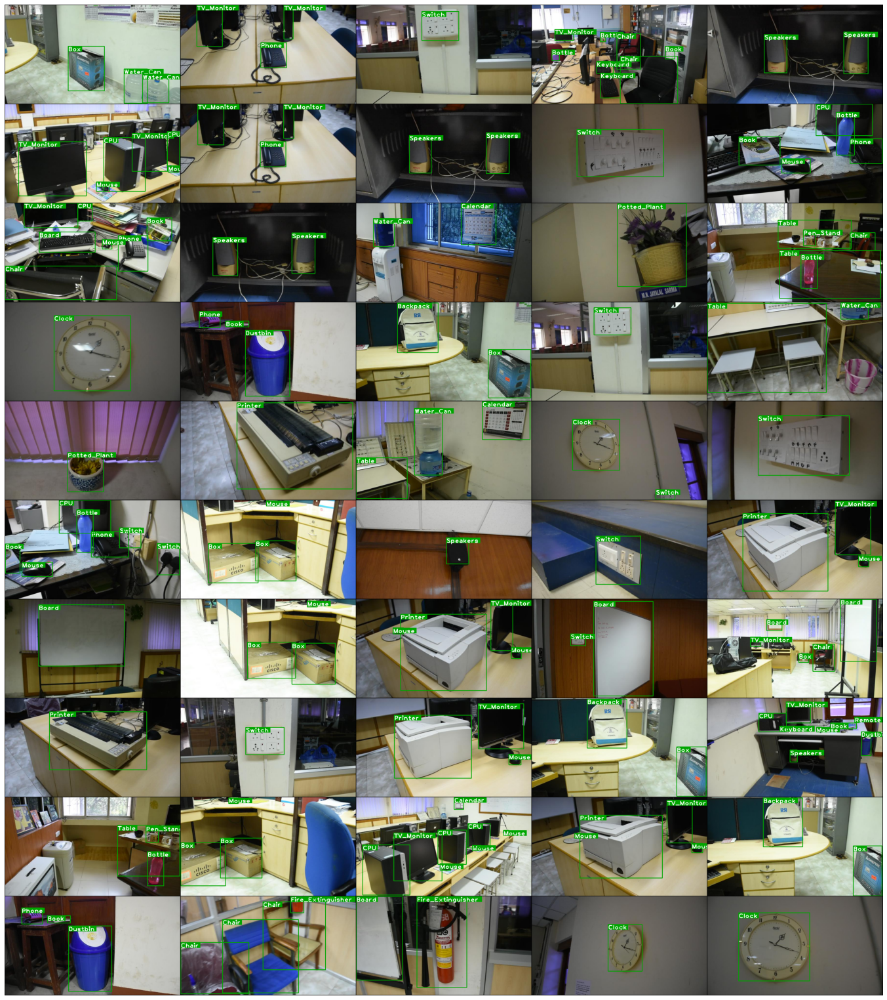

In [182]:
img_paths = list(Path("./data/images").glob("*.jpg"))
show_grid(img_paths, show_gt=True)

### Detecting using pretrained YOLOv5x model

In [111]:
!python detect.py --weights yolov5x.pt \
  --img 640 --conf 0.75 --source ./data/images --iou-thres 0.5

detect: weights=['yolov5x.pt'], source=./data/images, imgsz=[640, 640], conf_thres=0.75, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13

requirements: 1 package updated per /content/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv5 🚀 v6.0-110-gfcd180d torch 1.10.0+cu111 CPU

100% 166M/166M [00:03<00:00, 58.0MB/s]

Fusing layers... 
Model Summary: 444 layers, 86705005 parameters, 0 gradients
image 1/50 /content/yolov5/data/i

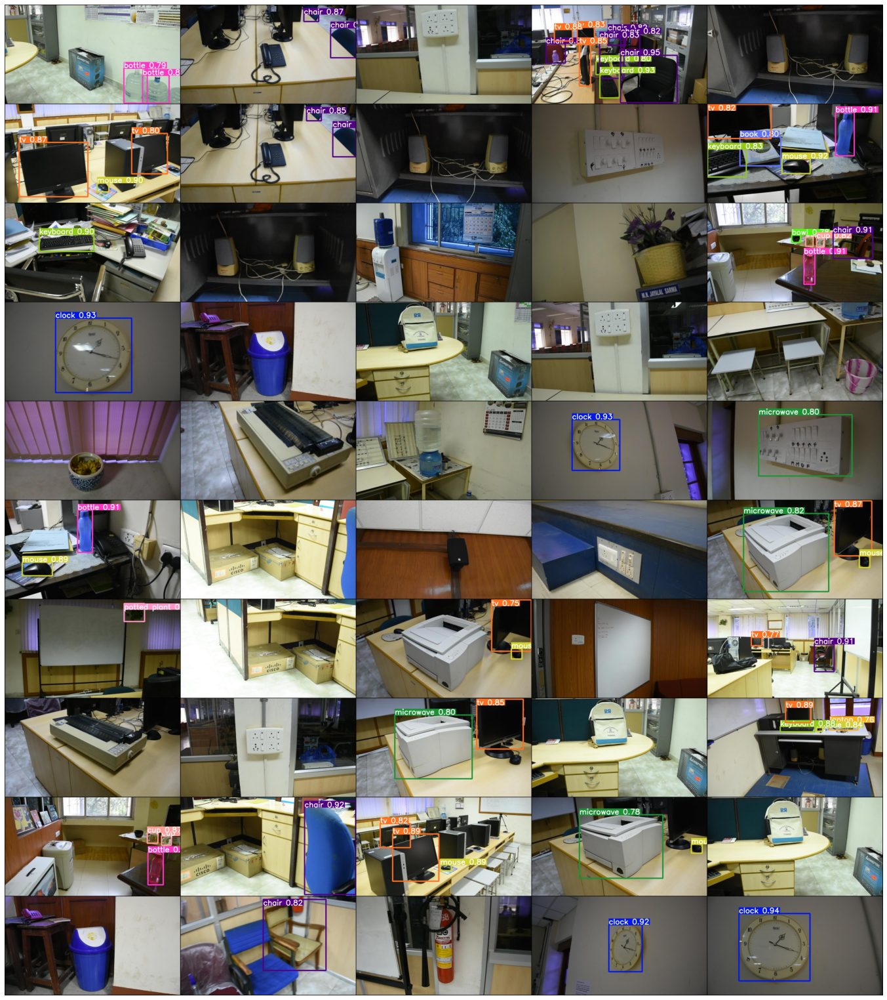

In [113]:
img_paths = list(Path("runs/detect/exp").glob("*.jpg"))
show_grid(img_paths)

###Detecting using custom trained model on YOLOv5x using best weights

In [114]:
!python detect.py --weights '/content/drive/MyDrive/CS6350TPA_3/best(6).pt' \
  --img 640 --conf 0.75 --source ./data/images --iou-thres 0.5

detect: weights=['/content/drive/MyDrive/CS6350TPA_3/best(6).pt'], source=./data/images, imgsz=[640, 640], conf_thres=0.75, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-110-gfcd180d torch 1.10.0+cu111 CPU

Fusing layers... 
Model Summary: 444 layers, 86368555 parameters, 0 gradients
image 1/50 /content/yolov5/data/images/DSC_0796_000232.jpg: 384x640 1 Printer, Done. (2.164s)
image 2/50 /content/yolov5/data/images/DSC_0796_000329.jpg: 384x640 1 Printer, Done. (2.136s)
image 3/50 /content/yolov5/data/images/DSC_0798_000004.jpg: 384x640 1 Mouse, 1 TV_Monitor, 1 Printer, Done. (2.138s)
image 4/50 /content/yolov5/data/images/DSC_0798_000029.jpg: 384x640 1 Mouse, 1 TV_Monitor, 1 Printer, Done. (2.152s)
imag

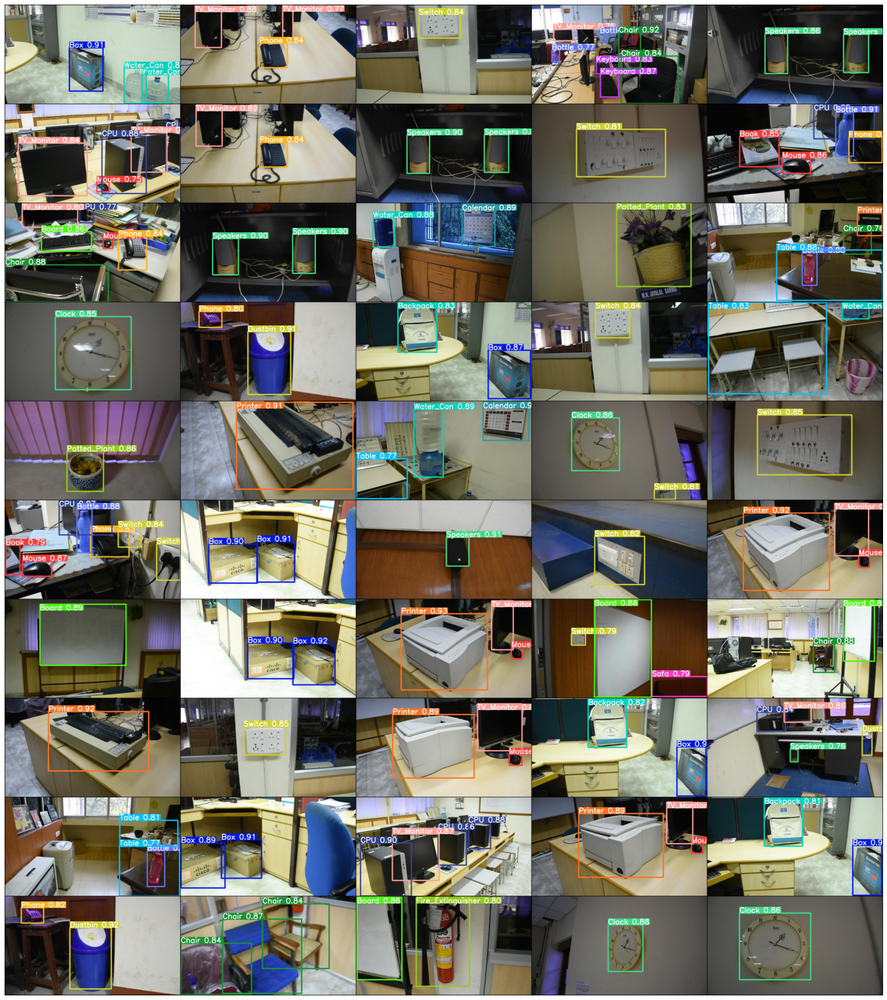

In [115]:
img_paths = list(Path("runs/detect/exp2").glob("*.jpg"))
show_grid(img_paths)

### Final Test Data

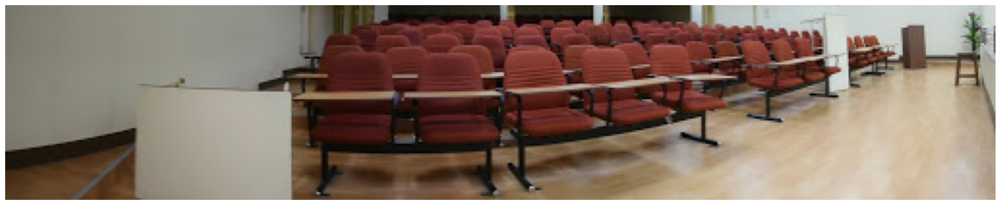

In [168]:
img_paths = list(Path("/content/drive/MyDrive/CS6350TPA_3/TPA3_Object_Detection/").glob("Copy of 1.jpg"))
show_grid(img_paths, resize=False)

In [ ]:
img_paths = list(Path("/content/drive/MyDrive/CS6350TPA_3/TPA3_Object_Detection/").glob(".jpg"))[:-1]
show_grid(img_paths)

### Final Test Data: Detections using pretrained yolov5x

In [125]:
!python detect.py --weights yolov5x.pt \
  --img 640 --conf 0.2 --source /content/drive/MyDrive/CS6350TPA_3/TPA3_Object_Detection/ --iou-thres 0.5

detect: weights=['yolov5x.pt'], source=/content/drive/MyDrive/CS6350TPA_3/TPA3_Object_Detection/, imgsz=[640, 640], conf_thres=0.2, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-110-gfcd180d torch 1.10.0+cu111 CPU

Fusing layers... 
Model Summary: 444 layers, 86705005 parameters, 0 gradients
image 1/8 /content/drive/.shortcut-targets-by-id/1qhsORFmsy1nBfyBaPew9Jq7QH5uyglU9/TPA3_Object_Detection/Copy of 1.jpg: 128x640 2 benchs, 7 chairs, 1 potted plant, Done. (0.779s)
image 2/8 /content/drive/.shortcut-targets-by-id/1qhsORFmsy1nBfyBaPew9Jq7QH5uyglU9/TPA3_Object_Detection/DSC_1027_000006.jpg: 384x640 2 bottles, 11 chairs, 7 tvs, 3 keyboards, Done. (2.227s)
image 3/8 /content/drive/.shortcut-targets-by-id

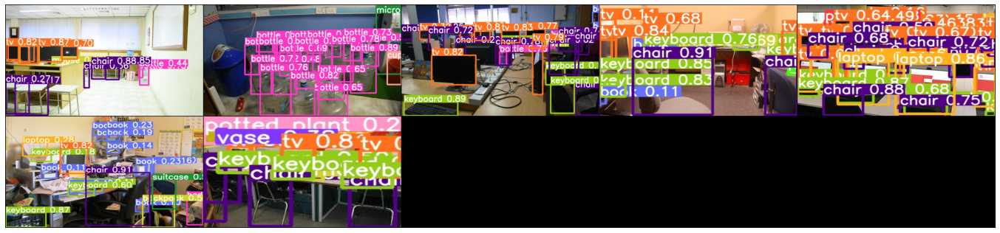

In [163]:
img_paths = list(Path("runs/detect/exp4").glob("*.jpg"))[:-1]
show_grid(img_paths)

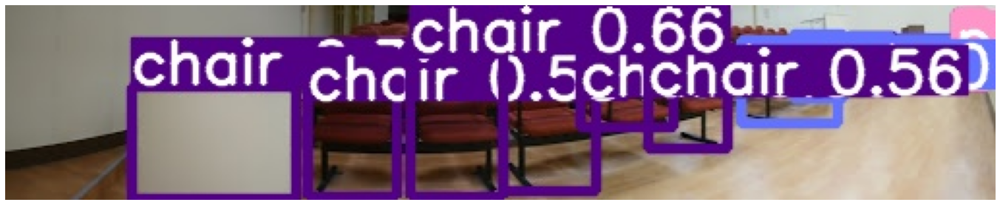

In [165]:
img_paths = list(Path("runs/detect/exp4").glob("Copy of 1.jpg"))
show_grid(img_paths, resize=False)

### Final Test Data: Detections using yolov5x trained on VPLab dataset

In [156]:
!python detect.py --weights '/content/drive/MyDrive/CS6350TPA_3/best(6).pt' \
  --img 640 --conf 0.1 --source /content/drive/MyDrive/CS6350TPA_3/TPA3_Object_Detection/ --iou-thres 0.5

detect: weights=['/content/drive/MyDrive/CS6350TPA_3/best(6).pt'], source=/content/drive/MyDrive/CS6350TPA_3/TPA3_Object_Detection/, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-110-gfcd180d torch 1.10.0+cu111 CPU

Fusing layers... 
Model Summary: 444 layers, 86368555 parameters, 0 gradients
image 1/8 /content/drive/.shortcut-targets-by-id/1qhsORFmsy1nBfyBaPew9Jq7QH5uyglU9/TPA3_Object_Detection/Copy of 1.jpg: 128x640 5 Chairs, 1 Shelf, Done. (0.780s)
image 2/8 /content/drive/.shortcut-targets-by-id/1qhsORFmsy1nBfyBaPew9Jq7QH5uyglU9/TPA3_Object_Detection/DSC_1027_000006.jpg: 384x640 1 Mouse, 2 TV_Monitors, 1 Chair, 1 CPU, 2 Bottles, 6 Keyboards, Done. (2.201s)
image 3/

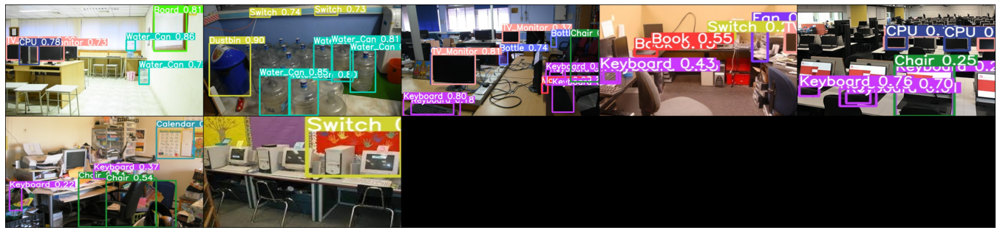

In [157]:
img_paths = list(Path("runs/detect/exp9").glob("*.jpg"))[:-1]
show_grid(img_paths)

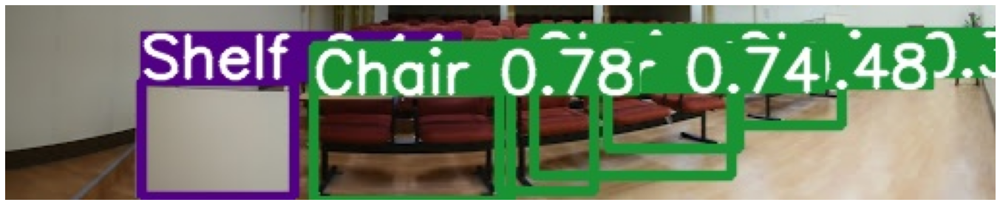

In [161]:
img_paths = list(Path("runs/detect/exp9").glob("Copy of 1.jpg"))
show_grid(img_paths, resize=False)

# Evaluation

In [ ]:
!python val.py --data /content/drive/MyDrive/CS6350TPA_3/YOLOv5-PLA-Dataset/dataset.yaml --weights '/content/drive/MyDrive/CS6350TPA_3/best(6).pt' --task test --img 640 --conf 0.75 --iou-thres 0.5

val: data=/content/drive/MyDrive/CS6350TPA_3/YOLOv5-PLA-Dataset/dataset.yaml, weights=['/content/drive/MyDrive/CS6350TPA_3/best(6).pt'], batch_size=32, imgsz=640, conf_thres=0.75, iou_thres=0.5, task=test, device=, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.0-96-g8df64a9 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 444 layers, 86368555 parameters, 0 gradients
test: Scanning '/content/drive/MyDrive/CS6350TPA_3/YOLOv5-PLA-Dataset/labels/test' images and labels...980 found, 0 missing, 0 empty, 6 corrupted: 100% 980/980 [14:23<00:00,  1.14it/s]
test: WARNING: /content/drive/MyDrive/CS6350TPA_3/YOLOv5-PLA-Dataset/images/test/DSC_1002_000131.jpg: ignoring corrupt image/label: negative label values [  -0.013889   -0.024691]
test: WARNING: /content/drive/MyDrive/CS6350TPA_3/YOLOv5-PLA-Dataset/images/test/DSC

# YOLOv5 Gradio demo

In [171]:
!pip install -qr https://raw.githubusercontent.com/ultralytics/yolov5/master/requirements.txt gradio # install dependencies

     |████████████████████████████████| 979 kB 8.8 MB/s 
     |████████████████████████████████| 206 kB 52.6 MB/s 
     |████████████████████████████████| 1.9 MB 42.8 MB/s 
     |████████████████████████████████| 961 kB 63.1 MB/s 
     |████████████████████████████████| 3.6 MB 41.9 MB/s 
     |████████████████████████████████| 63 kB 2.6 MB/s 


In [ ]:
import gradio as gr
import torch
from PIL import Image

# Images
torch.hub.download_url_to_file('https://github.com/ultralytics/yolov5/raw/master/data/images/zidane.jpg', 'zidane.jpg')
torch.hub.download_url_to_file('https://github.com/ultralytics/yolov5/raw/master/data/images/bus.jpg', 'bus.jpg')

# Model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/CS6350TPA_3/best(6).pt')  # force_reload=True to update


def yolo(im, size=640):
    g = (size / max(im.size))  # gain
    im = im.resize((int(x * g) for x in im.size), Image.ANTIALIAS)  # resize

    results = model(im)  # inference
    results.render()  # updates results.imgs with boxes and labels
    return Image.fromarray(results.imgs[0])


inputs = gr.inputs.Image(type='pil', label="Original Image")
outputs = gr.outputs.Image(type="pil", label="Output Image")

title = "YOLOv5"
description = "YOLOv5 Gradio demo for object detection. Upload an image or click an example image to use."
article = "<p style='text-align: center'>YOLOv5 is a family of compound-scaled object detection models trained on the COCO dataset, and includes " \
          "simple functionality for Test Time Augmentation (TTA), model ensembling, hyperparameter evolution, " \
          "and export to ONNX, CoreML and TFLite. <a href='https://github.com/ultralytics/yolov5'>Source code</a> |" \
          "<a href='https://apps.apple.com/app/id1452689527'>iOS App</a> | <a href='https://pytorch.org/hub/ultralytics_yolov5'>PyTorch Hub</a></p>"

examples = [['zidane.jpg'], ['bus.jpg'], ['/drive/MyDrive/CS6350TPA_3/YOLOv5-PLA-Dataset/images/train/DSC_1895_000136.jpg']]
gr.Interface(yolo, inputs, outputs, title=title, description=description, article=article, examples=examples, analytics_enabled=False).launch(
    debug=True)

#Comparison Plots

In [243]:
def grouped_bar_graph(set_1_label, set_1, set_2_label, set_2, title, xlabels, ylabel, right=2.3):
  x = np.arange(len(xlabels))  # the label locations
  width = 0.35  # the width of the bars

  plt.style.use('seaborn')
  fig, ax = plt.subplots()
  fig.subplots_adjust(bottom=0, top=1, left=0, right=right)
  rects1 = ax.bar(x - width/2, set_1, width, label=set_1_label)
  rects2 = ax.bar(x + width/2, set_2, width, label=set_2_label)

  # Add some text for labels, title and custom x-axis tick labels, etc.
  ax.set_ylabel(ylabel)
  ax.set_title(title, pad=20)
  ax.set_xticks(x)
  ax.set_xticklabels(xlabels, rotation=60)
  ax.legend()


  def autolabel(rects):
      """Attach a text label above each bar in *rects*, displaying its height."""
      for rect in rects:
          height = rect.get_height()
          ax.annotate('{}'.format(height),
                      xy=(rect.get_x() + rect.get_width() / 2, height),
                      xytext=(0, 3),  # 3 points vertical offset
                      textcoords="offset points",
                      ha='center', va='bottom', rotation=90)


  autolabel(rects1)
  autolabel(rects2)

  # fig.tight_layout()

  plt.show()

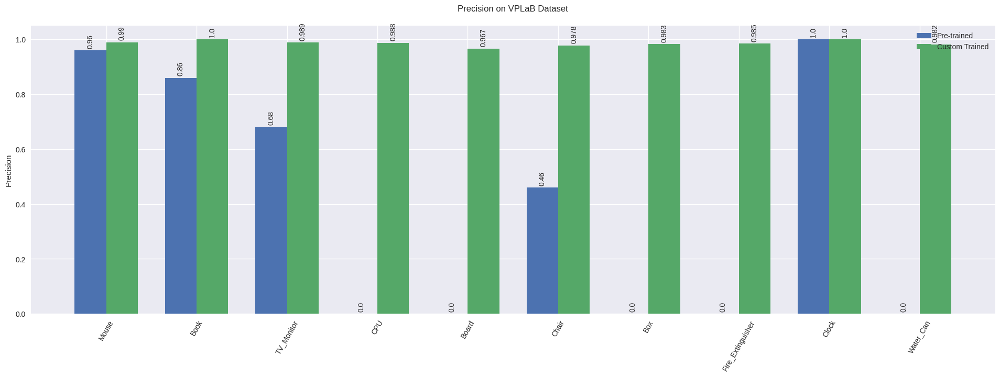

In [239]:
labels = ['Mouse', 'Book', 'TV_Monitor', 'CPU', 'Board', 'Chair', 'Box', 'Fire_Extinguisher', 'Clock', 'Water_Can']
set_1 = [0.96, 0.86, 0.68, 0, 0, 0.46, 0, 0, 1, 0]
set_2 = [0.99, 1, 0.989, 0.988, 0.967, 0.978, 0.983, 0.985, 1, 0.982]

grouped_bar_graph('Pre-trained', set_1, 'Custom Trained', set_2, "Precision on VPLaB Dataset",labels, "Precision")

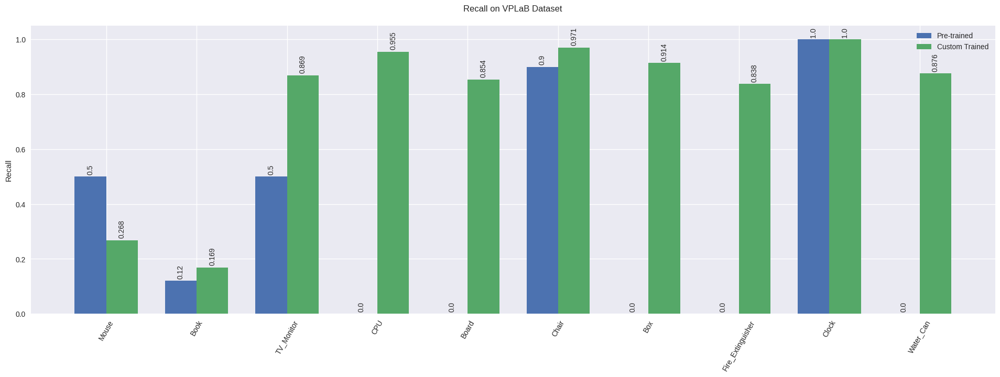

In [240]:
set_1 = [0.5, 0.12, 0.5, 0, 0, 0.9, 0, 0, 1, 0]
set_2 = [0.268, 0.169, 0.869, 0.955, 0.854, 0.971, 0.914, 0.838, 1, 0.876]

grouped_bar_graph('Pre-trained', set_1, 'Custom Trained', set_2, "Recall on VPLaB Dataset",labels, "Recall")

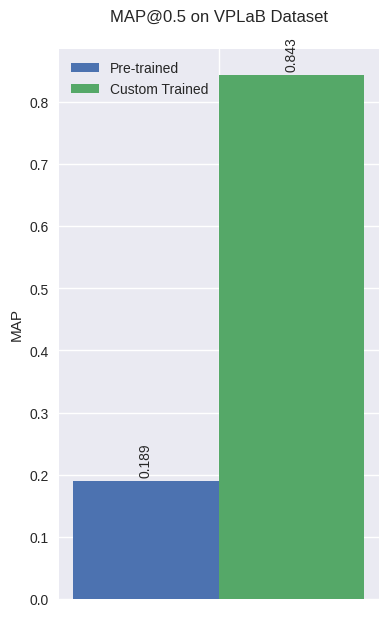

In [246]:
set_1 = [0.189]
set_2 = [0.843]

grouped_bar_graph('Pre-trained', set_1, 'Custom Trained', set_2, "MAP@0.5 on VPLaB Dataset", [" "], "MAP", right=0.4)